In [1]:
using  Base.Threads,Random

In [2]:
include("../lib/ParRep.jl")
using .ParRep

In [3]:
Base.@kwdef mutable struct GelmanRubinDiagnostic{F}
    observables::F
    means = Matrix{Float64}(undef,1,1)
    sq_means = Matrix{Float64}(undef,1,1)
    burn_in = 10
    tol = 1e-3
    # gr_hist = Float64[]
end

function ParRep.check_dephasing!(checker::GelmanRubinDiagnostic,replicas::Vector{X},step_n) where {X}
    
    if step_n == 1 # initialize running mean and running square_mean buffer
        checker.means = zeros(length(checker.observables),length(replicas))
        checker.sq_means = copy(checker.means)
    end
    
    @threads for i=1:length(replicas)
        r = replicas[i]
        for (j,f)=enumerate(checker.observables)
            val = f(r)
            sq_val = val^2

            checker.means[j,i] += (val-checker.means[j,i]) / step_n
            checker.sq_means[j,i] += (sq_val-checker.sq_means[j,i]) / step_n

        end
    end

    (step_n < checker.burn_in) && return false

    Obar = sum(checker.means;dims = 2) / length(replicas)

    numerator = sum(@. (checker.sq_means -2checker.means*Obar + Obar^2);dims=2)
    denominator = sum(checker.sq_means - checker.means .^ 2;dims=2)

    R = maximum(numerator ./ denominator) - 1
    # push!(checker.gr_hist,R)
    return (R < checker.tol)
end


In [10]:
Base.@kwdef mutable struct SteepestDescentState{X}
    η = 0.1
    dist_tol = 1e-2
    grad_tol = 1e-3
    steps = 100
    minima = X[]
    ∇V::Function
end

function ParRep.get_macrostate!(checker::SteepestDescentState,walker::X,current_state,traj_hist=nothing) where {X}
    x = copy(walker)
    grad_norm = Inf
    for k=1:checker.steps
        (traj_hist !== nothing) && push!(traj_hist,x)
        grad = checker.∇V(x)
        x -= checker.η * grad # gradient descent step

        for (i,m)=enumerate(checker.minima)
            dist = √sum(abs2,m-x)
            if dist < checker.dist_tol
                return i
            end
        end

        grad_norm = √sum(abs2,grad)
        (grad_norm < checker.grad_tol) && break
    end

    if grad_norm < checker.grad_tol
        push!(checker.minima,x)
        return length(checker.minima)
    else
        return nothing
    end
end

In [5]:
const A = [-200,-100,-170,15]
const a = [-1,-1,-6.5,0.7]
const b = [0,0,11,0.6]
const c = [-10,-10,-6.5,0.7]
const x0 = [1,0,-0.5,-1]
const y0 = [0,0.5,1.5,1]

4-element Vector{Float64}:
 0.0
 0.5
 1.5
 1.0

In [6]:
mueller_brown(x,y) = sum(@. A*exp(a*(x-x0)^2 + b*(x-x0)*(y-y0)+c*(y-y0)^2))
mueller_brown(X) = mueller_brown(X...)

function grad_mueller_brown(x,y)
    v = @. A*exp(a*(x-x0)^2 + b*(x-x0)*(y-y0)+c*(y-y0)^2)
    return [sum(@. (2a*(x-x0)+b*(y-y0))*v), sum(@. (2c*(y-y0)+b*(x-x0))*v) ]
end

grad_mueller_brown(X) = grad_mueller_brown(X...)
grad_mueller_brown(0,0)

2-element Vector{Float64}:
 -120.44528523713869
 -108.79148986312214

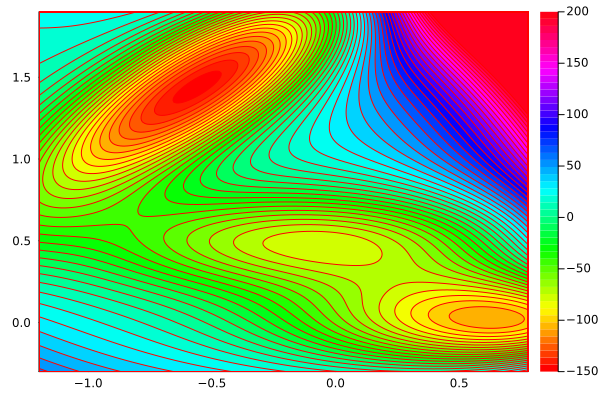

In [17]:
using Plots

xlims = -1.2,0.78
ylims = -0.3,1.9

xrange = range(xlims...,200)
yrange = range(ylims...,200)
pl_gd = contourf(xrange,yrange,mueller_brown,levels=50,clims=(-150,200),cmap=:hsv)

In [20]:
gradient_descender = SteepestDescentState{Vector{Float64}}(η=1e-4,∇V = grad_mueller_brown,steps=500)

for i=1:100
    x_init = rand(xrange)
    y_init = rand(yrange)
    traj_hist = [[x_init,y_init]]
    ParRep.get_macrostate!(gradient_descender,[x_init,y_init],nothing,traj_hist)

    xs=[x[1] for x in traj_hist]
    ys=[x[2] for x in traj_hist]

    plot!(pl_gd,xs,ys,color=:black,label="",linestyle=:dash)
end

gradient_descender.minima = [[-0.5582252581719034, 1.44172421670824], [-0.050006449263200685, 0.46669356979822535], [0.6235010485040672, 0.028037654671532172]]


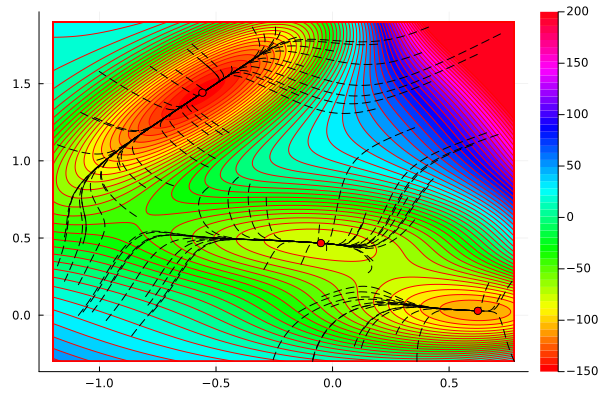

In [21]:
@show gradient_descender.minima
minx,miny = [m[1] for m in gradient_descender.minima],[m[2] for m in gradient_descender.minima]
scatter!(pl_gd,minx,miny,color=:red,label="")

In [29]:
for m in gradient_descender.minima
    @show m
    @show mueller_brown(m)
    @show sqrt(sum(abs2,grad_mueller_brown(m)))
end

m = [0.6234977152933896, 0.02803786529726638]
mueller_brown(m) = -108.16672411607297
sqrt(sum(abs2, grad_mueller_brown(m))) = 0.0009207165031670193
m = [-0.5582252359078875, 1.4417242389936153]
mueller_brown(m) = -146.69951720890037
sqrt(sum(abs2, grad_mueller_brown(m))) = 0.000930111117552548
m = [-0.050006449579706076, 0.4666935698369464]
mueller_brown(m) = -80.76781812751354
sqrt(sum(abs2, grad_mueller_brown(m))) = 0.0009738970354074405


In [24]:
Base.@kwdef struct OverdampedLangevinEulerMaruyama{F}
    dt::Float64
    β::Float64
    ∇V::F
    n_steps=1
    σ = √(2dt/β)
end

function ParRep.update_microstate!(X,simulator::OverdampedLangevinEulerMaruyama;rng=Random.GLOBAL_RNG)
    for k=1:simulator.n_steps
        X .= X-simulator.∇V(X)*simulator.dt + simulator.σ*randn(rng,size(X)...)
    end
end

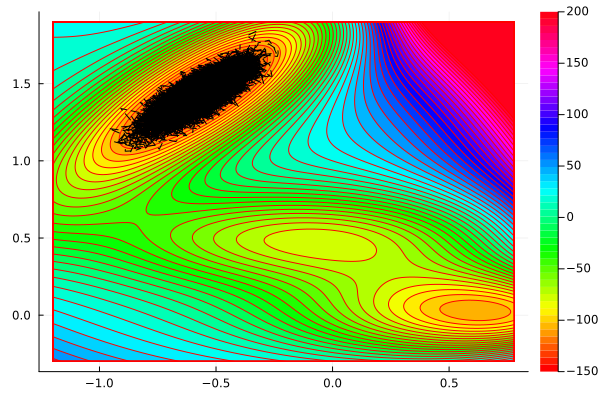

In [26]:
sim = OverdampedLangevinEulerMaruyama(dt = 1e-4,β = 0.2,∇V = grad_mueller_brown,n_steps=2)
X = first(gradient_descender.minima)
traj_hist = [copy(X)]
for i=1:50000
    ParRep.update_microstate!(X,sim)
    push!(traj_hist,copy(X))
end
contourf(xrange,yrange,mueller_brown,levels=50,clims=(-150,200),cmap=:hsv)
xs,ys = [x[1] for x in traj_hist],[x[2] for x in traj_hist]
plot!(xs,ys,linestyle=:dash,color=:black,label="")

In [27]:
struct ExitEventKiller end
ParRep.check_death(::ExitEventKiller,state_a,state_b,_) = (state_a != state_b)

In [29]:
alg = GenParRepAlgorithm(N=nthreads(),
                        simulator = sim,
                        dephasing_checker = GelmanRubinDiagnostic(observables=[x->x[1],x->x[2]]),
                        macrostate_checker = SteepestDescentState{Vector{Float64}}(η=1e-4,∇V = grad_mueller_brown,steps=500),
                        replica_killer = ExitEventKiller(),
                        reference_walker = [-0.5,0.5])

UndefKeywordError: UndefKeywordError: keyword argument `logger` not assigned

In [19]:
ParRep.simulate!(alg,10)

UndefVarError: UndefVarError: `get_state!` not defined

In [114]:
Base.@kwdef struct LJClusterInteraction2D{N}
    σ=1.0
    σ6=σ^6
    σ12=σ6^2
    ε=1.0
    α=1.0 # sharpness of harmonic confining potential
end

function lj_energy(X,inter::LJClusterInteraction2D{N}) where {N}
    V = 0.0
    for i=1:N-1
        for j=i+1:N
            inv_r6=inv(sum(abs2,X[:,i]-X[:,j]))^3
            V += (inter.σ12*inv_r6-inter.σ6)*inv_r6
        end
    end
    return 4inter.ε*V+inter.α*sum(abs2,X)/2 # add confining potential
end

function lj_grad(X,inter::LJClusterInteraction2D{N}) where {N}
    F = zeros(2,N)
    for i=1:N-1
        r = zeros(2)
        f = zeros(2)
        for j=i+1:N
            r = X[:,i]-X[:,j]
            inv_r2 = inv(sum(abs2,r))
            inv_r4 = inv_r2^2
            inv_r8 = inv_r4^2
            
            f = (6inter.σ6 - 12inter.σ12*inv_r2*inv_r4)*inv_r8*r

            F[:,i] .+= f
            F[:,j] .-= f
        end
    end

    return 4inter.ε*F + inter.α*X #add confining potential
end

lj_grad (generic function with 1 method)

In [193]:
Base.@kwdef mutable struct SteepestDescentStateSym{X,E,F} # determine state by steepest descent (case of symetric energy landscape) 
    η = 5e-4
    grad_tol = 1e-2
    e_tol = 1e-1
    steps = 1000
    minima = X[]
    minimums = Float64[]
    V::E
    ∇V::F
end

function ParRep.get_macrostate!(checker::SteepestDescentStateSym,walker,current_macrostate,traj_hist=nothing,steps_to_cv = nothing)
    x = copy(walker)
    grad_norm = Inf

    cv_step = 0
    while (grad_norm > checker.grad_tol) #for k=1:checker.steps
        (traj_hist !== nothing) && push!(traj_hist,x)
        grad = checker.∇V(x)
        x -= checker.η * grad # gradient descent step
        cv_step +=1
        grad_norm = maximum(abs.(grad))
    end
    
    (steps_to_cv !== nothing) && push!(steps_to_cv,cv_step)
    
    if grad_norm < checker.grad_tol
        
        pot = checker.V(x)

        if isempty(checker.minimums)

            push!(checker.minima,x)
            push!(checker.minimums,pot)

            return 1
        else
            ΔEs = @. abs(pot - checker.minimums)
            imin = argmin(ΔEs)

            if ΔEs[imin] < checker.e_tol
                return imin
            else
                push!(checker.minima,x)
                push!(checker.minimums,pot)

                return length(checker.minima)
            end 
        end
    else # steepest descent has not converged in alloted number of iterations
        return nothing
    end
end

In [215]:
using Plots

N_cluster = 7
inter = LJClusterInteraction2D{N_cluster}()


pot(x) = lj_energy(x,inter)
grad_pot(x) = lj_grad(x,inter)

sim = OverdampedLangevinSimulator(dt = 5e-4,β = 5.0,∇V = (x->lj_grad(x,inter)),n_steps=1)
X = zeros(2,N_cluster)

k = ceil(Int,sqrt(N_cluster))

for i=1:N_cluster
    X[1,i] = i ÷ k
    X[2,i] = i % k
end

X .-= (k-1)/2

@show pot(X)

for i=1:1000
    update_state!(X,sim)
end

# anim= @animate for i=1:1000
#     (i%10 == 0) && println(i)
#     update_state!(X,sim)
#     scatter(X[1,:],X[2,:],label="",xlims=(-k,k),ylims=(-k,k))
# end

# mp4(anim,"./anims/lj_cluster.mp4")

pot(X) = 1.117179883789062


In [213]:
@show X
x_traj = Array{Float64,2}[]

state_checker = SteepestDescentStateSym{typeof(X),typeof(pot),typeof(grad_pot)}(V=pot,∇V = grad_pot,η=5e-3,steps=2000,grad_tol = 5e-2,e_tol=8e-2)

@show ParRep.get_macrostate!(state_checker,X,1,x_traj)

X = [-1.028662724040276 -0.7298126091895025 -0.10941717003035505 0.1521958244817606 0.39041551531881313 0.9776274729998635 1.2014555500491524; -0.1781758225968439 0.8956472043494879 -1.0288712672821794 0.010499933427659806 1.0832321830597091 -0.7772016428952476 0.36092065053943856]
ParRep.get_macrostate!(state_checker, X, 1, x_traj) = 1


1

In [214]:
anim = @animate for x in x_traj
    grad = maximum(abs.(grad_pot(x)))
    energy = pot(x)

    scatter(x[1,:],x[2,:],label="V: $(round(energy,digits=2)), ∇V: $(round(grad,digits=2))",xlims=(-k,k),ylims=(-k,k),aspectratio=1,color=[:red,:green,:blue,:gray,:pink,:orange,:yellow],markersize=10)
end

mp4(anim,"gd_lj.mp4")

┌ Info: Saved animation to /home/nblassel/Documents/QSDs.jl/par_rep_benchmarks/gd_lj.mp4
└ @ Plots /home/nblassel/.julia/packages/Plots/rz1WP/src/animation.jl:156


Plots.AnimatedGif("/home/nblassel/Documents/QSDs.jl/par_rep_benchmarks/gd_lj.mp4")

In [221]:
for i=1:N_cluster
    X[1,i] = i ÷ k
    X[2,i] = i % k
end

X .-= (k-1)/2

steps_per_check = 1
state_checker = SteepestDescentStateSym{typeof(X),typeof(pot),typeof(grad_pot)}(V=pot,∇V = grad_pot,η=5e-3,steps=10000,grad_tol = 2e-2,e_tol=5e-2)
sim_cold = OverdampedLangevinSimulator(dt = 5e-4,β = 5.0,∇V = (x->lj_grad(x,inter)),n_steps=1000)
sts = Union{Int64,Nothing}[]
steps_to_cv = Int64[]

colors=[:red,:green,:blue,:gray,:pink,:orange,:yellow]

anim_sts = @animate for i=1:5000
    (i%100 == 0) && (println(i))
    for s=1:steps_per_check
        update_state!(X,sim_cold)
    end

    x_traj = Array{Float64,2}[]
    state = ParRep.get_macrostate!(state_checker,X,1,x_traj,steps_to_cv)
    push!(sts,state)
    m = last(x_traj)
    plot(scatter(X[1,:],X[2,:],label="",xlims=(-k,k),ylims=(-k,k),aspectratio=1,color=colors,markersize=10),scatter(m[1,:],m[2,:],label="state = $state",xlims=(-k,k),ylims=(-k,k),aspectratio=1,color=colors,markersize=10),title="t = $(round(sim_cold.dt*i*1000,digits=2))")
end


100


200


300


400


500


600


700


800


900


1000


1100


1200


1300


1400


1500


1600


1700


1800


1900


2000


2100


2200


2300


2400


2500


2600


2700


2800


2900


3000


3100


3200


3300


3400


3500


3600


3700


3800


3900


4000


4100


4200


4300


4400


4500


4600


4700


4800


4900


5000


Animation("/tmp/jl_k3dlCN", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "004991.png", "004992.png", "004993.png", "004994.png", "004995.png", "004996.png", "004997.png", "004998.png", "004999.png", "005000.png"])

In [222]:
mp4(anim_sts,"sts_vcold.mp4")

┌ Info: Saved animation to /home/nblassel/Documents/QSDs.jl/par_rep_benchmarks/sts_vcold.mp4
└ @ Plots /home/nblassel/.julia/packages/Plots/rz1WP/src/animation.jl:156


Plots.AnimatedGif("/home/nblassel/Documents/QSDs.jl/par_rep_benchmarks/sts_vcold.mp4")

In [223]:
@show state_checker.minimums
perm = sortperm(state_checker.minimums)

state_checker.minimums = [-8.809819588156357, -6.926870885924494, -7.182867269697692]


3-element Vector{Int64}:
 1
 3
 2

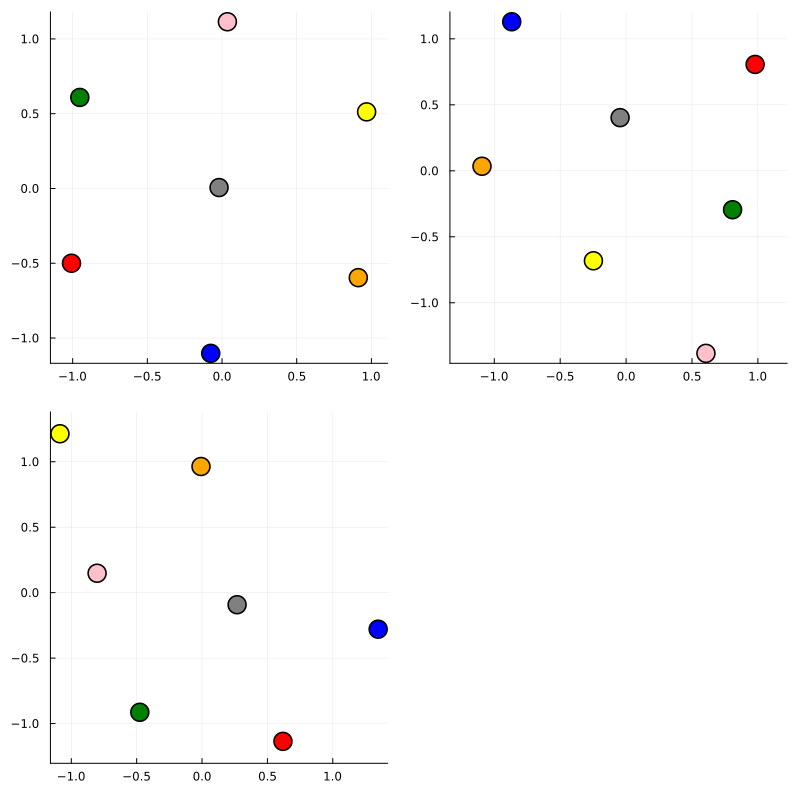

In [224]:
plot([scatter(m[1,:],m[2,:],label="",color=colors) for m in state_checker.minima[perm]]...,size=(800,800),aspectratio=1,markersize=10)

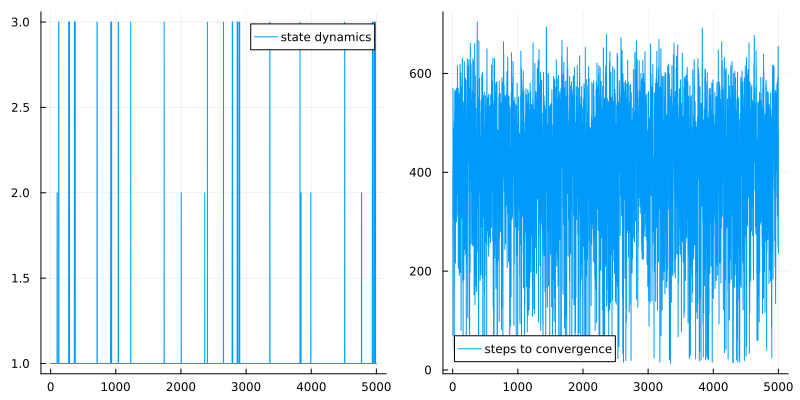

In [225]:
plot([plot(sts,label="state dynamics"),plot(steps_to_cv,label="steps to convergence")]...,size=(800,400))